In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle
import re
from umap import UMAP
from hdbscan import HDBSCAN
import torch
from transformers import RobertaTokenizer, RobertaConfig, RobertaModel
from collections.abc import Iterable
from transformers import AutoTokenizer, AutoModel
from bertopic import BERTopic
import torch
from collections import deque
from bertopic.representation import KeyBERTInspired
from tqdm import tqdm


/Users/cslab/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
# 파일 불러오기
with open('../../data/bert_src_df.pkl', 'rb') as f:
    bert_src_df = pickle.load(f)


In [3]:
bert_src_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5223203 entries, 0 to 5223202
Data columns (total 5 columns):
 #   Column          Dtype         
---  ------          -----         
 0   q_id            int64         
 1   a_id            float64       
 2   q_creationdate  datetime64[ns]
 3   tags            object        
 4   body            object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 199.2+ MB


In [4]:
cond1 = bert_src_df['q_creationdate']>='2021-11-30'
cond2 = bert_src_df['q_creationdate']<='2022-11-30' # chatgpt전
cond3 = bert_src_df['q_creationdate']>='2022-12-01' # chatgpt후

cond4 = bert_src_df['a_id'].isna()==True
cond5 = bert_src_df['a_id'].isna()==False

cond6 = bert_src_df['tags'].str.contains('python')


In [5]:
bert_src_bf_noanswer = bert_src_df.loc[cond1 & cond2       & cond4         & cond6, :]
bert_src_af_noanswer = bert_src_df.loc[cond3               & cond4         & cond6, :]

In [6]:
bert_src_bf_yesanswer = bert_src_df.loc[cond1 & cond2        & cond5         & cond6, :]
bert_src_af_yesanswer = bert_src_df.loc[cond3                & cond5         & cond6, :]

In [7]:
print(bert_src_bf_yesanswer.shape)
print(bert_src_af_yesanswer.shape)
print(bert_src_bf_noanswer.shape)
print(bert_src_af_noanswer.shape)

(274332, 5)
(138303, 5)
(46961, 5)
(63445, 5)


In [8]:
bert_src_bf_yesanswer = bert_src_bf_yesanswer.sample(n=500,replace=False)
bert_src_af_yesanswer = bert_src_af_yesanswer.sample(n=500,replace=False)
bert_src_bf_noanswer = bert_src_bf_noanswer.sample(n=500,replace=False)
bert_src_af_noanswer = bert_src_af_noanswer.sample(n=500,replace=False)

In [9]:
bert_src_rand = pd.concat([bert_src_bf_yesanswer, bert_src_af_yesanswer,bert_src_bf_noanswer, bert_src_af_noanswer ], axis = 0)

In [10]:
bert_src_rand

,q_id,a_id,q_creationdate,tags,body
1911655,70381958,70421615.0,2021-12-16 15:52:44.063,<python><azure><azure-synapse>,<p>our group is starting to work on Azure Syna...
2117599,71116130,71218064.0,2022-02-14 17:48:55.210,<python><async-await><jupyter-notebook><ipython>,<p>I know that several similar questions exist...
5006214,74614441,74627655.0,2022-11-29 12:57:04.703,<mysql><python-3.x><ubuntu><mysql-python>,<p>I'm trying to install the MySQLdb package f...
1687397,73737542,75067242.0,2022-09-15 21:19:22.397,<python>,<p>Just starting to use backtesting.py on a si...
1234803,72293453,72293662.0,2022-05-18 17:19:15.603,<python><curve-fitting><scipy-optimize>,<p>I know the topic was already tackled 6 year...
...,...,...,...,...,...
2624072,77351719,NaN,2023-10-24 11:36:12.070,<python><numpy>,<p><code>with np.printoptions</code>'s <a href...
3895651,77031939,NaN,2023-09-03 10:47:13.710,<python><resnet>,"<p>I m trying to use vgg16,resnet, efficientne..."
1135458,77412139,NaN,2023-11-02 18:44:50.943,<python><jupyter-notebook><line-profiler>,<p>I'm interested in using line_profiler for a...
2339060,75200177,NaN,2023-01-22 11:54:28.833,<python><mqtt><fastapi>,<p>I have the following requirements to implem...


In [11]:
def cleanhtml(raw_html):
  # 1.Source code in python language is hard to understand, so replace all the <code> tag first
  cleantext_1 = re.findall(r'(?<=\<code>)(.*?)(?=<\/code>)', raw_html.replace('\n', '_**_'))
  cleantext_1 = [x.replace('_**_', '\n') for x in cleantext_1]
  # 2. replace html tags
  # <p>
  tag_re = re.compile('<.*?>')
  cleantext_2 = [re.sub(tag_re, '', x) for x in cleantext_1]
  return cleantext_2

In [12]:
# apply the function, cleanhtml to the question and body text
bert_src_rand.loc[:, 'q_prep_text'] = bert_src_rand['body'].apply(cleanhtml)

In [13]:
bert_src_rand = bert_src_rand.reset_index(drop=True)

In [14]:
bert_src_rand = bert_src_rand[['q_id', 'q_prep_text']].apply(pd.Series.explode)

In [15]:
bert_src_rand.dropna(inplace=True)

In [16]:
# PREPROCESSING FOR CODE SCRIPT
def preprocess_script(script):
    new_script = deque()
    old_script = script.split('\n')
    for line in old_script:
        if line.lstrip().startswith('#'): # 주석으로 시작되는 행 skip
            continue
        line = line.rstrip()
        if '#' in line:
            line = line[:line.index('#')] # 주석 전까지 코드만 저장
        line = line.replace('\n','') # 개행 문자를 모두 삭제함
        line = line.replace('    ','\t') # 공백 4칸을 tab으로 변환
        
        if line == '': # 전처리 후 빈 라인은 skip
            continue
        
        new_script.append(line)

        
    new_script = '\n'.join(new_script) # 개행 문자로 합침
    new_script = re.sub('("""[\w\W]*?""")', '<str>', new_script)
    new_script = re.sub("('''[\w\W]*?''')", '<str>', new_script)
    new_script = re.sub('/^(http?|https?):\/\/([a-z0-9-]+\.)+[a-z0-9]{2,4}.*$/', '', new_script)
    
    return new_script


In [17]:
bert_src_rand

,q_id,q_prep_text
1,71116130,async
1,71116130,! pip install numpy\n! pip install pandas\n
1,71116130,3-alpine
1,71116130,Traceback (most recent call last):\n File &qu...
1,71116130,import numpy
...,...,...
1998,75200177,add
1998,75200177,add
1998,75200177,result
1998,75200177,result


In [18]:
bert_src_rand['q_prep_text_non'] = bert_src_rand['q_prep_text'].apply(preprocess_script)

In [19]:
src = bert_src_rand['q_prep_text_non'].tolist()
# df['sentiments'].values.tolist()


In [20]:
src

['async',
 '! pip install numpy\n! pip install pandas',
 '3-alpine',
 "Traceback (most recent call last):\n  File &quot;/usr/local/lib/python3.7/site-packages/ipykernel/kernelbase.py&quot;, line 461, in dispatch_queue\n\tawait self.process_one()\n  File &quot;/usr/local/lib/python3.7/site-packages/ipykernel/kernelbase.py&quot;, line 450, in process_one\n\tawait dispatch(*args)\nTypeError: object NoneType can't be used in 'await' expression",
 'import numpy',
 "python3 Get_Acess_and_Refresh_Tokens.py\nTraceback (most recent call last):\n  File &quot;/home/*****/Desktop/*****/Get_Acess_and_Refresh_Tokens.py&quot;, line 6, in &lt;module&gt;\n\tfrom MySQLdb import _mysql\nModuleNotFoundError: No module named 'MySQLdb'",
 "~$ sudo apt-get install python-mysqldb\nReading package lists... Done\nBuilding dependency tree... Done\nReading state information... Done\nPackage python-mysqldb is not available, but is referred to by another package.\nThis may mean that the package is missing, has been

In [21]:
print(type(src))
print(type(src[0]))
print(len(src))

<class 'list'>
<class 'str'>
6087


In [22]:
# 데이터 로드
data = src

In [23]:
data = data

In [24]:
# CodeBERT 모델과 토크나이저 로드
model_name = "microsoft/codebert-base"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

In [25]:
# 임베딩 함수 정의
def embed_text(text):
    encoded_input = tokenizer(text, padding=True, truncation=True, return_tensors='pt')
    with torch.no_grad():
        model_output = model(**encoded_input)
    return model_output.last_hidden_state[:, 0, :]

In [26]:
embed_text_list = []
for i in tqdm(range(len(data))) : 
    embed_text_list.append(embed_text(data[i]))

100%|██████████| 6087/6087 [10:27<00:00,  9.69it/s]


In [27]:
# 모든 텍스트에 대한 임베딩 계산
embeddings = torch.cat(embed_text_list, dim=0).numpy()  # 텐서로 연결 후 numpy 배열로 변환

In [28]:
embeddings.shape

(6087, 768)

In [29]:
umap_model = UMAP(n_neighbors=10, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

In [30]:
hdbscan_model = HDBSCAN(min_cluster_size=20, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

In [31]:
representation_model = KeyBERTInspired()

In [32]:
# BERTopic 모델 초기화 및 훈련
topic_model = BERTopic( embedding_model=model,
                        umap_model=umap_model,
                        hdbscan_model=hdbscan_model,
                        representation_model=representation_model)  # 임베딩 모델 사용을 비활성화
topics, probabilities = topic_model.fit_transform(data, embeddings)


In [33]:
# 결과 출력
print(topic_model.get_topic_info())  # 토픽 정보 출력

    Topic  Count                                               Name  \
0      -1   2145                                   -1_none_10_20_12   
1       0    442  0_pandas_results_canvas_results_frame_results_...   
2       1    425                    1_dataframe_pandas_csv_read_csv   
3       2    411                        2_df_df2_dict_feedback_dict   
4       3    254                   3_conda_cuda_python3_pyinstaller   
5       4    168                   4_epoch_03t13_30t13_pyhd8ed1ab_1   
6       5    134                            5_pyads_josney_mp_pyomo   
7       6    116        6_arcpy_sudokuplay_sudokusetup_length_board   
8       7    111      7_integerfield_received_data_model_foreignkey   
9       8    102                   8_locktype__thread___dict___type   
10      9     99                     9_python_py_list__pydevd_runpy   
11     10     95              10_do_something_else_lit_pl__delegate   
12     11     85   11_attributeerror_valueerror_typeerror_nameerror   
13    

In [34]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2145,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class..."
1,0,442,0_pandas_results_canvas_results_frame_results_...,"[pandas, results_canvas, results_frame, result...",[import seaborn as sns\nimport numpy as np\nfr...
2,1,425,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...
3,2,411,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['..."
4,3,254,3_conda_cuda_python3_pyinstaller,"[conda, cuda, python3, pyinstaller, python_app...",[conda activate pytorch-cuda\nconda install py...
5,4,168,4_epoch_03t13_30t13_pyhd8ed1ab_1,"[epoch, 03t13, 30t13, pyhd8ed1ab_1, 3h, pyhd8e...",[start_datetime\t\t end_datetime\n2023-01-01 ...
6,5,134,5_pyads_josney_mp_pyomo,"[pyads, josney, mp, pyomo, pydantic_factories,...","[pyads, pyads, pyads]"
7,6,116,6_arcpy_sudokuplay_sudokusetup_length_board,"[arcpy, sudokuplay, sudokusetup, length_board,...",[@app.cli.command()\ndef scheduled():\n\t&quot...
8,7,111,7_integerfield_received_data_model_foreignkey,"[integerfield, received_data, model, foreignke...",[from django.db import models\nclass UserProfi...
9,8,102,8_locktype__thread___dict___type,"[locktype, _thread, __dict__, type, fsm, multi...","[_thread.LockType.acquire, _thread.LockType.__..."


In [35]:
topic_model.get_topic(0)

[('pandas', 0.3942473),
 ('results_canvas', 0.35950118),
 ('results_frame', 0.35191968),
 ('results_label', 0.2901332),
 ('webdriver', 0.2657068),
 ('requests', 0.24797036),
 ('csv', 0.24194974),
 ('elif', 0.2330111),
 ('numpy', 0.22799347),
 ('request', 0.21837553)]

In [36]:
topic_model.get_topic(1)

[('dataframe', 0.53309095),
 ('pandas', 0.51487255),
 ('csv', 0.35616058),
 ('read_csv', 0.31007537),
 ('df', 0.2715655),
 ('append', 0.23747823),
 ('columns', 0.22007594),
 ('json', 0.22002828),
 ('print', 0.21783769),
 ('list', 0.19240533)]

In [37]:
topic_model.get_topic(6, full=True)

{'Main': [('arcpy', 0.4574697),
  ('sudokuplay', 0.41326594),
  ('sudokusetup', 0.35161495),
  ('length_board', 0.35126993),
  ('print', 0.33024955),
  ('what_number', 0.29552096),
  ('row', 0.2917356),
  ('grid', 0.2819196),
  ('enter', 0.2617769),
  ('append', 0.2562826)]}

In [38]:
# # Label the topics yourself
# topic_model.set_topic_labels({1: "Space Travel", 7: "Religion"})

# # or use one of the other topic representations, like KeyBERTInspired
# keybert_topic_labels = {topic: " | ".join(list(zip(*values))[0][:3]) for topic, values in topic_model.topic_aspects_["KeyBERT"].items()}
# topic_model.set_topic_labels(keybert_topic_labels)

# # or ChatGPT's labels
# chatgpt_topic_labels = {topic: " | ".join(list(zip(*values))[0]) for topic, values in topic_model.topic_aspects_["OpenAI"].items()}
# chatgpt_topic_labels[-1] = "Outlier Topic"
# topic_model.set_topic_labels(chatgpt_topic_labels)

In [39]:
# topic_distr, _ = topic_model.approximate_distribution(data, window=8, stride=4)

In [40]:
# pip install nbformat>=4.2.0

In [41]:
# Visualize the topic-document distribution for a single document
topic_model.visualize_topics()

In [42]:
topic_model.visualize_hierarchy()

In [43]:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)

In [44]:
topic_model.visualize_documents(data, embeddings=embeddings)

In [45]:
topic_model.visualize_documents(data, reduced_embeddings=reduced_embeddings)

In [46]:
topa_df = topic_model.get_document_info(src)

In [47]:
topa_df

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,async,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
1,! pip install numpy\n! pip install pandas,3,3_conda_cuda_python3_pyinstaller,"[conda, cuda, python3, pyinstaller, python_app...",[conda activate pytorch-cuda\nconda install py...,conda - cuda - python3 - pyinstaller - python_...,1.0,False
2,3-alpine,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
3,Traceback (most recent call last):\n File &qu...,31,31_python3_attributeerror_python10_keyerror,"[python3, attributeerror, python10, keyerror, ...",[Traceback (most recent call last):\n File &q...,python3 - attributeerror - python10 - keyerror...,1.0,False
4,import numpy,29,29_import_importlib_elo_calculator_python,"[import, importlib, elo_calculator, python, ex...","[import, @import, from . import elo_calculator]",import - importlib - elo_calculator - python -...,1.0,False
...,...,...,...,...,...,...,...,...
6082,add,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6083,add,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6084,result,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6085,result,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False


In [49]:
topa_org_df = bert_src_rand.copy()
topa_org_df.reset_index(drop=True, inplace=True)
topa_df.reset_index(drop=True, inplace=True)

In [50]:
tot_topa_df = pd.concat([topa_org_df, topa_df], axis = 1)

In [51]:
tot_topa_df[tot_topa_df['Topic'] == 1]

,q_id,q_prep_text,q_prep_text_non,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
10,72059380,iterate :: (a -&gt; a) -&gt; a -&gt; [a]\niter...,iterate :: (a -&gt; a) -&gt; a -&gt; [a]\niter...,iterate :: (a -&gt; a) -&gt; a -&gt; [a]\niter...,1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.982049,False
13,73812819,# data is the dictionary with the values as sh...,for N in data:\n\tout = path + f'{name}({N})'\...,for N in data:\n\tout = path + f'{name}({N})'\...,1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.818784,False
16,72724437,"df = pd.DataFrame({&quot;x&quot;: [1,2,3,4], &...","df = pd.DataFrame({&quot;x&quot;: [1,2,3,4], &...","df = pd.DataFrame({&quot;x&quot;: [1,2,3,4], &...",1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,1.000000,False
19,72195857,"def passanger_list(passangerInput, pp): \n ...","def passanger_list(passangerInput, pp):\n\tpp ...","def passanger_list(passangerInput, pp):\n\tpp ...",1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.943829,False
24,70551224,dbc.Col([\n html.Div(id=f'live-...,dbc.Col([\n\t\t\t\thtml.Div(id=f'live-update-t...,dbc.Col([\n\t\t\t\thtml.Div(id=f'live-update-t...,1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,1.000000,False
...,...,...,...,...,...,...,...,...,...,...,...
6004,75163087,"files = {'file': (&quot;test_upload.png&quot;,...","files = {'file': (&quot;test_upload.png&quot;,...","files = {'file': (&quot;test_upload.png&quot;,...",1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.925902,False
6006,75163087,"files = {'file': (&quot;test_upload.png&quot;,...","files = {'file': (&quot;test_upload.png&quot;,...","files = {'file': (&quot;test_upload.png&quot;,...",1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.907207,False
6025,75135974,\n@mock.patch(&quot;app.file.upload_file_to_gc...,@mock.patch(&quot;app.file.upload_file_to_gcs&...,@mock.patch(&quot;app.file.upload_file_to_gcs&...,1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.975571,False
6045,77170542,class MyData(pydantic.BaseModel):\n type: t...,class MyData(pydantic.BaseModel):\n\ttype: typ...,class MyData(pydantic.BaseModel):\n\ttype: typ...,1,1_dataframe_pandas_csv_read_csv,"[dataframe, pandas, csv, read_csv, df, append,...",[import requests\nimport json\nf = open(&quot;...,dataframe - pandas - csv - read_csv - df - app...,0.997288,False


In [52]:
tot_topa_df[tot_topa_df['Topic'] == 2]

,q_id,q_prep_text,q_prep_text_non,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
12,73812819,"data = {'OS': {'IOS', 'Linux', 'Windows'}, 'Wo...","data = {'OS': {'IOS', 'Linux', 'Windows'}, 'Wo...","data = {'OS': {'IOS', 'Linux', 'Windows'}, 'Wo...",2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,0.926745,False
21,70551224,"@app.callback(Output('live-update-text', 'chil...","@app.callback(Output('live-update-text', 'chil...","@app.callback(Output('live-update-text', 'chil...",2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
22,70551224,@app.callback(Output('live-update-text-MyParam...,@app.callback(Output('live-update-text-MyParam...,@app.callback(Output('live-update-text-MyParam...,2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
34,74248480,result = User.objects.values('type').annotate(...,result = User.objects.values('type').annotate(...,result = User.objects.values('type').annotate(...,2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
40,70434952,"soup.find_all('table', id ='dlAplics')","soup.find_all('table', id ='dlAplics')","soup.find_all('table', id ='dlAplics')",2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
...,...,...,...,...,...,...,...,...,...,...,...
5978,77521883,import pytz\ntz_aest = pytz.timezone('Australi...,import pytz\ntz_aest = pytz.timezone('Australi...,import pytz\ntz_aest = pytz.timezone('Australi...,2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
6014,77212874,print(socket.gethostbyaddr('homeassistant.loca...,print(socket.gethostbyaddr('homeassistant.loca...,print(socket.gethostbyaddr('homeassistant.loca...,2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
6046,77170542,'A','A','A',2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False
6047,77170542,'B','B','B',2,2_df_df2_dict_feedback_dict,"[df, df2, dict, feedback_dict, iloc, list, fir...","[df['B'] = np.where(not isfloat(df['B']), df['...",df - df2 - dict - feedback_dict - iloc - list ...,1.000000,False


In [53]:
tot_topa_df

,q_id,q_prep_text,q_prep_text_non,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,71116130,async,async,async,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
1,71116130,! pip install numpy\n! pip install pandas\n,! pip install numpy\n! pip install pandas,! pip install numpy\n! pip install pandas,3,3_conda_cuda_python3_pyinstaller,"[conda, cuda, python3, pyinstaller, python_app...",[conda activate pytorch-cuda\nconda install py...,conda - cuda - python3 - pyinstaller - python_...,1.0,False
2,71116130,3-alpine,3-alpine,3-alpine,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
3,71116130,Traceback (most recent call last):\n File &qu...,Traceback (most recent call last):\n File &qu...,Traceback (most recent call last):\n File &qu...,31,31_python3_attributeerror_python10_keyerror,"[python3, attributeerror, python10, keyerror, ...",[Traceback (most recent call last):\n File &q...,python3 - attributeerror - python10 - keyerror...,1.0,False
4,71116130,import numpy,import numpy,import numpy,29,29_import_importlib_elo_calculator_python,"[import, importlib, elo_calculator, python, ex...","[import, @import, from . import elo_calculator]",import - importlib - elo_calculator - python -...,1.0,False
...,...,...,...,...,...,...,...,...,...,...,...
6082,75200177,add,add,add,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6083,75200177,add,add,add,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6084,75200177,result,result,result,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False
6085,75200177,result,result,result,-1,-1_none_10_20_12,"[none, 10, 20, 12, 11, blank, unlimited, 30, 1...","[None, class QuizTake(FormView):\n\tform_class...",none - 10 - 20 - 12 - 11 - blank - unlimited -...,0.0,False


In [55]:
bert_src_df

,q_id,a_id,q_creationdate,tags,body
0,77135756,77135852.0,2023-09-19 15:04:00.773,<sql><sql-server><t-sql><gaps-and-islands>,<p>I have a mssql table such as the below</p>\...
1,77042177,77042771.0,2023-09-05 06:31:45.120,<python><r><websocket><discord>,<p>I am using the package (websocket) for R to...
2,77043480,77044253.0,2023-09-05 09:52:20.073,<sql><postgresql><go><sqlc>,<p>I have just modified a table in PostgreSQL ...
3,77044076,NaN,2023-09-05 11:21:44.530,<azure-devops><github-api>,<p>i want to call a github rest api endpoint f...
4,77044219,NaN,2023-09-05 11:44:21.233,<php><mysql><ssl><openssl>,<p>I'm trying to authenticate to my MySQL Data...
...,...,...,...,...,...
5223198,77336843,NaN,2023-10-21 16:16:36.243,<kubernetes><grpc><kubernetes-ingress><istio><...,<p>Trying to setup grpc service via istio ingr...
5223199,77329980,77331074.0,2023-10-20 09:55:04.267,<kubernetes><kubernetes-helm><argocd><kustomize>,<p>I'm trying to activate kustomize for argoCD...
5223200,77329980,77330215.0,2023-10-20 09:55:04.267,<kubernetes><kubernetes-helm><argocd><kustomize>,<p>I'm trying to activate kustomize for argoCD...
5223201,77575036,77575314.0,2023-11-29 23:27:11.720,<c#><unity-game-engine><visual-studio-2022>,<p>I'm trying to detect a collision between tw...


In [58]:
tot_topa_df = pd.merge(tot_topa_df, bert_src_df[['q_id', 'q_creationdate']], how='left', left_on = 'q_id', right_on = 'q_id')

In [61]:
tot_topa_df['date'] = pd.to_datetime(tot_topa_df['q_creationdate']).dt.date

In [67]:
tot_topa_rate = tot_topa_df.groupby(['date', 'Topic']).count()[['q_id']].reset_index()

In [74]:
tot_topa_date = tot_topa_rate.groupby(['date']).sum()[['q_id']].reset_index()

In [77]:
topic_per_rate = pd.merge(tot_topa_rate, tot_topa_date, on = 'date')

In [80]:
topic_per_rate = topic_per_rate.rename({'q_id_x': 'cnt', 'q_id_y':'tot_cnt'})

In [86]:
topic_per_rate['rate'] = topic_per_rate['q_id_x']/topic_per_rate['q_id_y']*100

In [88]:
topic_per_rate[topic_per_rate['Topic'] == 0]

,date,Topic,q_id_x,q_id_y,rate
1,2021-11-30,0,3,12,25.000000
18,2021-12-03,0,1,6,16.666667
27,2021-12-07,0,1,17,5.882353
34,2021-12-08,0,3,47,6.382979
45,2021-12-09,0,1,15,6.666667
...,...,...,...,...,...
3198,2023-11-10,0,1,4,25.000000
3211,2023-11-14,0,1,6,16.666667
3218,2023-11-16,0,1,1,100.000000
3230,2023-11-20,0,4,17,23.529412


In [91]:
%matplotlib inline 
import matplotlib.pyplot as plt

array([datetime.date(2021, 11, 30), datetime.date(2021, 12, 1),
       datetime.date(2021, 12, 2), datetime.date(2021, 12, 3),
       datetime.date(2021, 12, 5), datetime.date(2021, 12, 6),
       datetime.date(2021, 12, 7), datetime.date(2021, 12, 8),
       datetime.date(2021, 12, 9), datetime.date(2021, 12, 10),
       datetime.date(2021, 12, 11), datetime.date(2021, 12, 12),
       datetime.date(2021, 12, 14), datetime.date(2021, 12, 15),
       datetime.date(2021, 12, 16), datetime.date(2021, 12, 17),
       datetime.date(2021, 12, 19), datetime.date(2021, 12, 20),
       datetime.date(2021, 12, 21), datetime.date(2021, 12, 22),
       datetime.date(2021, 12, 23), datetime.date(2021, 12, 27),
       datetime.date(2021, 12, 28), datetime.date(2021, 12, 30),
       datetime.date(2021, 12, 31), datetime.date(2022, 1, 1),
       datetime.date(2022, 1, 2), datetime.date(2022, 1, 3),
       datetime.date(2022, 1, 4), datetime.date(2022, 1, 5),
       datetime.date(2022, 1, 6), datetime.

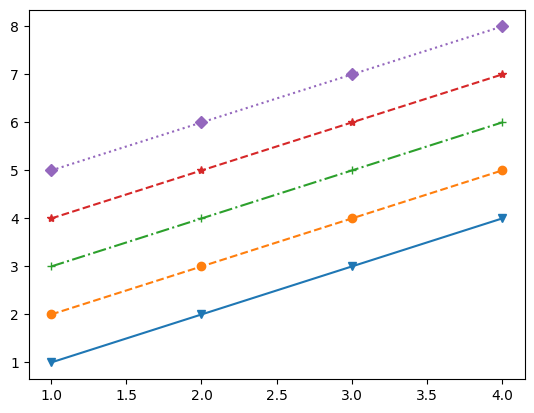

In [92]:
x = topic_per_rate['date'].unique()
plt.plot(x, x+0, "-v") 
plt.plot(x, x+1, "o--") 
plt.plot(x, x+2, "+-.") 
plt.plot(x, x+3, "*--") 
plt.plot(x, x+4, "D:")